In [1]:
import numpy as np
import cv2 
import matplotlib.pyplot as plt
import time
import random

# Helper Functions

In [2]:
def read_img(path):
    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def show_img(img,text='',dpi=120):
    l,b,_ = img.shape
    fig,ax = plt.subplots(dpi=dpi)
    ax.imshow(img)
    ax.axis("off")
    plt.suptitle(text)
    plt.show()
    return

In [3]:
"""
SIFT matching and related functions
"""
import cv2 

def show_SIFT(img):
    gray= cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    kp, des = sift.detectAndCompute(gray,None)
    img_kp = cv2.drawKeypoints(img,kp,None)

    return img_kp


def sift_matches(img1_col, img2_col):
    img1 = cv2.cvtColor(img1_col, cv2.COLOR_BGR2GRAY)
    img2 = cv2.cvtColor(img2_col, cv2.COLOR_BGR2GRAY)

    #sift
    sift = cv2.SIFT_create()

    keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
    keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

    #feature matching
    bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

    matches = bf.match(descriptors_1,descriptors_2)
    matches = sorted(matches, key = lambda x:x.distance)

    img3 = cv2.drawMatches(img1_col, keypoints_1, img2_col, keypoints_2, matches[:200], None, flags=2)
    x1 = np.float32([ keypoints_1[m.queryIdx].pt for m in matches ]).reshape(-1,2)
    x2 = np.float32([ keypoints_2[m.trainIdx].pt for m in matches ]).reshape(-1,2)

    return img3, x1, x2



In [4]:
"""
Homography and related functions
"""

def homo(arr):
    return np.hstack((arr, np.ones((arr.shape[0], 1))))


def de_homo(arr):
    with np.errstate(divide='ignore', invalid='ignore'):
        arr = np.divide(arr,(arr[:,-1].reshape(-1,1)))
    arr[np.isnan(arr)] = 1e9

    return arr[:,:-1]

def error(x,xr):
    return np.mean(np.linalg.norm((x-xr), axis=1))

 
def homography(x1,x2):
    A = np.vstack(( np.hstack(([x1,0*x1,-x1*x2[:,0].reshape(-1,1)])) , 
                    np.hstack(([0*x1,x1,-x1*x2[:,1].reshape(-1,1)])) ))
    
    _, _, vt = np.linalg.svd(A, full_matrices = True)  
    H = vt[-1].reshape(3, 3) #The last column of vt is the eigenvector corresponding to the least eigenvalue.

    if H[2,2]!=0:
        return H/H[2,2]
    else:
        return H


def RANSAC(x1,x2,t=3,n=4,k=100,d=0.15):
    
    if len(x1)>100:
        x1 = x1[:100,:]
        x2 = x2[:100,:]
    
    i = np.arange(0,len(x1)) ; d=d*len(x1)
    bH = np.zeros((3,3)); be = 1e9;
    
    if len(x1)<n:
        return bH,0
    
    for k1 in range(k):
        random.shuffle(i)
        X1 = x1[i[:n],:] ; X2 = x2[i[:n],:] ; H = homography(X1,X2)
        xr = (H@x1.T).T
        d1 = np.isclose(np.linalg.norm((de_homo(x2)-de_homo(xr)), axis=1),0, atol=t,rtol=0)
        d1 = np.sum(d1)
        
        if d1>=d:
            e1 = error(de_homo(x2),de_homo(xr)) ; d = d1 
            if be>e1:
                bH = H; be = e1
                
    return bH,d


def inliers(img1,img2):
    
    img3,x1,x2 = sift_matches(img1, img2)
    H,nc = RANSAC(homo(x1),homo(x2))

    xr = de_homo((H@homo(x1).T).T)

    inlier = (np.isclose(np.linalg.norm((x2-xr), axis=1),0, atol=3,rtol=0))
    outlier = np.logical_not(inlier)

    plt.scatter(x2[:,0],x2[:,1],marker=',')
    plt.scatter(xr[:,0],xr[:,1],marker='*')
    plt.imshow(img2)
    plt.axis("off")
    plt.title("Reconstruction")
    plt.show()

    plt.scatter(x2[inlier,0],x2[inlier,1],marker=',')
    plt.scatter(xr[inlier,0],xr[inlier,1],marker='*')
    plt.imshow(img2)
    plt.axis("off")
    plt.title("Inliers : count="+str(np.sum(inlier)))
    plt.show()


    plt.scatter(x2[outlier,0],x2[outlier,1],marker=',')
    plt.scatter(xr[outlier,0],xr[outlier,1],marker='*')
    plt.imshow(img2)
    plt.axis("off")
    plt.title("Outliers : count="+str(np.sum(outlier)))
    plt.show()
    
    return 

In [5]:
"""
Perspective 
"""

def perspective(img1, img2):

    _,x1,x2 = sift_matches(img1, img2)
    H,_ = RANSAC(homo(x1),homo(x2))
    m1,n1,_ = img1.shape
    m2,n2,_ = img2.shape

    A = np.asarray([[0,0],[0,m1-1],[n1-1,0],[n1-1,m1-1]])
    A = np.int32(de_homo((H@homo(A).T).T))
    A = np.vstack((A,[0,0],[0,m2-1],[n2-1,m2-1],[n2-1,0]))
    mini = np.min(A,axis=0)
    maxi = np.max(A,axis=0)

    if(np.any(mini<0)):
        return 0
    
    outImg = cv2.warpPerspective(img1, H, (maxi[0]+1,maxi[1]+1), borderMode=cv2.BORDER_CONSTANT, borderValue=(0, 0, 0))
    
    return outImg

In [6]:
"""
Stitching of images
"""
def trim(frame):
    #crop top
    if np.all(frame[0]==np.array([0,0,0])):
        return trim(frame[1:])
    #crop bottom
    elif np.all(frame[-1]==np.array([0,0,0])):
        return trim(frame[:-2])
    #crop left
    elif np.all(frame[:,0]==np.array([0,0,0])):
        return trim(frame[:,1:]) 
    #crop right
    elif np.all(frame[:,-1]==np.array([0,0,0])):
        return trim(frame[:,:-2])    
    return frame

def stitch(img1, img2):

    _,x1,x2 = sift_matches(img1, img2)
    H,_ = RANSAC(homo(x1),homo(x2))

    if np.all(H==0):
        return H
    
    m1,n1,_ = img1.shape
    m2,n2,_ = img2.shape

    A = np.asarray([[0,0],[0,m1-1],[n1-1,0],[n1-1,m1-1]])
    A = np.int32(de_homo((H@homo(A).T).T))
    A = np.vstack((A,[0,0],[0,m2-1],[n2-1,m2-1],[n2-1,0]))

    mini = np.min(A,axis=0)
    maxi = np.max(A,axis=0)

    if(np.any(mini<0)):
        img22 = np.pad(img2, ((-mini[1],0),(-mini[0],0),(0,0)), 'constant', constant_values=0)
        _,x1,x2 = sift_matches(img1, img22)
        H,_ = RANSAC(homo(x1),homo(x2))
        
    outImg = cv2.warpPerspective(img1, H, (maxi[0]-mini[0]+1,maxi[1]-mini[1]+1), borderMode=cv2.BORDER_CONSTANT, borderValue=(0, 0, 0))
    
    lower_green = np.array([0, 254, 0])    
    upper_green = np.array([1, 255, 1])
            
    mask = cv2.inRange(img2, lower_green, upper_green)
    img_mask = np.copy(img2)
    img_mask[mask != 0] = [0, 0, 0]

    img_out = np.where( img_mask==[0,0,0] , outImg[-mini[1]:-mini[1]+m2,-mini[0]:-mini[0]+n2], img2)
    
    outImg[-mini[1]:-mini[1]+m2,-mini[0]:-mini[0]+n2] = img_out
        
    outImg = trim(outImg)

    return outImg

# Question 1

## Part 1

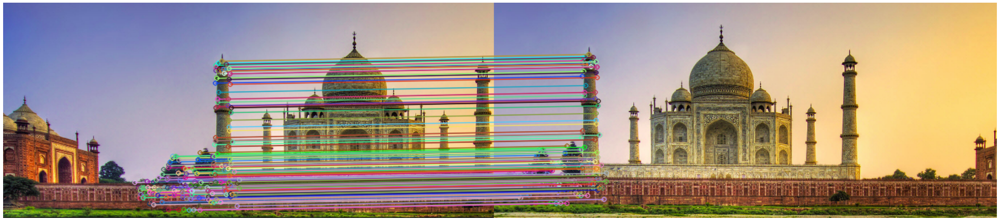

In [7]:
img1 = read_img('./../images/Image_Mosaicing/2_1.png')
img2 = read_img('./../images/Image_Mosaicing/2_2.png')
img3, x1, x2 = sift_matches(img1, img2)

plt.figure(figsize = [40,80])
plt.imshow(img3)
plt.axis('off')
plt.show()


SIFT matching is used to find matches between two partially overlapping images. The matchings are shown as output in the above cell.

## Part 2

In [8]:
img3,x1,x2 = sift_matches(img1, img2)
H,nc = RANSAC(homo(x1),homo(x2))
print(H)

[[ 9.99999197e-01 -1.34407141e-07 -1.82999823e+02]
 [-2.01024531e-07  9.99998452e-01 -9.99975735e+00]
 [-5.69718268e-10 -2.65549744e-09  1.00000000e+00]]


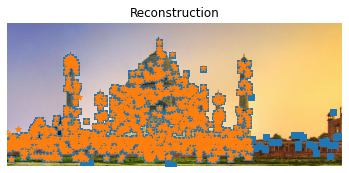

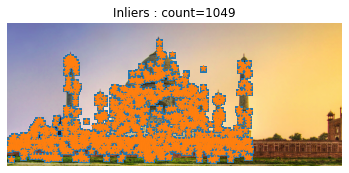

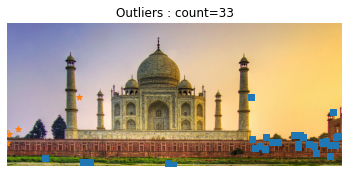

In [9]:
inliers(img1,img2)

## Part 3


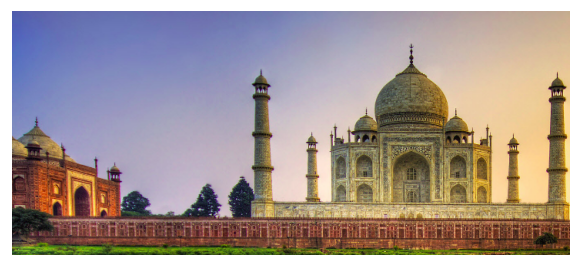

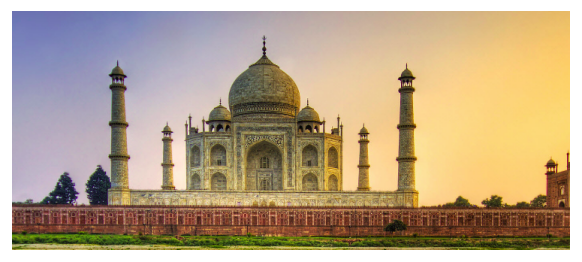

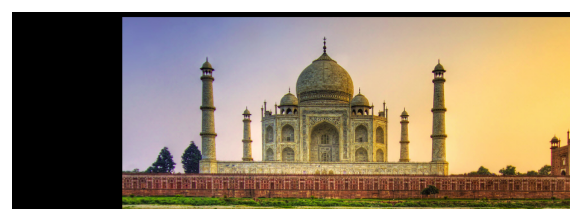

In [10]:
img1 = read_img('./../images/Image_Mosaicing/2_1.png')
img2 = read_img('./../images/Image_Mosaicing/2_2.png')
out = perspective(img2,img1)
show_img(img1,text='',dpi=120)
show_img(img2,text='',dpi=120)
show_img(out,text='',dpi=120)

## Part 4

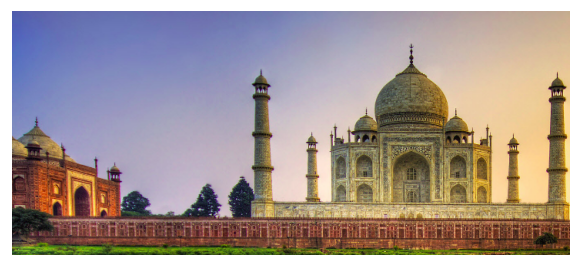

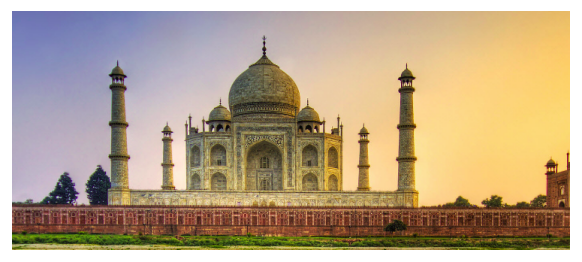

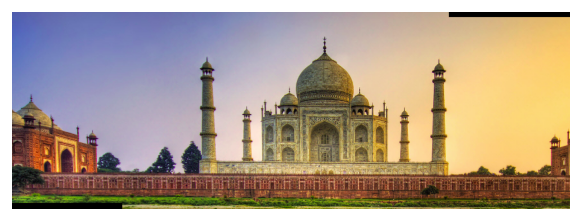

In [11]:
out = stitch(img2,img1)
show_img(img1,text='',dpi=120)
show_img(img2,text='',dpi=120)
show_img(out,text='',dpi=120)

## Part 5

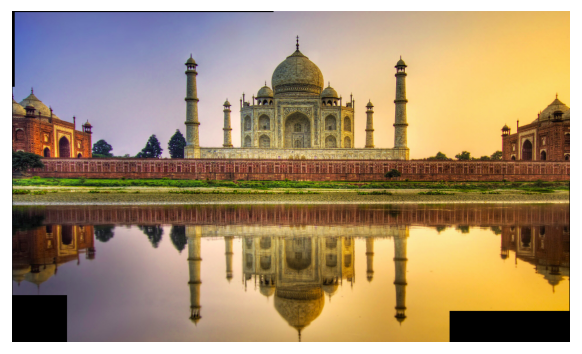

In [12]:
def stitch_multiple(img_arr):
    arr = list(range(len(img_arr)))
    i = 0
    while i<len(arr):
        if i==0:
            out = img_arr[0] 
            i=i+1
            continue
        
        out1 = stitch(img_arr[i],out)
        #show_img(out1,text='',dpi=120)
        if np.all(out1==0):
            k = arr[i]
            arr.remove(arr[i])
            arr.append(k)
        else:
            out = out1
            i=i+1
    
    return out

taj=[]
for i in [1,4,2,5,3,6]:
    img = read_img('./../images/Image_Mosaicing/2_'+str(i)+'.png')
    taj.append(img)
    #show_img(img,text='',dpi=120)

out = stitch_multiple(taj)
show_img(out,text='',dpi=120)

## Part 6

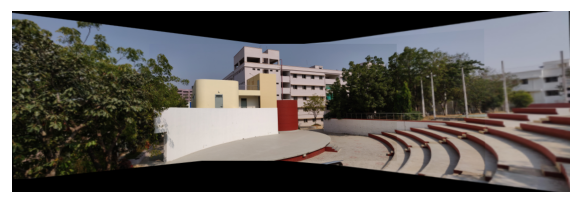

In [13]:
def resize(img, s=10):
    scale_percent = s # percent of original size
    width = int(img.shape[1] * scale_percent / 100)
    height = int(img.shape[0] * scale_percent / 100)
    dim = (width, height)
  
    return cv2.resize(img, dim, interpolation = cv2.INTER_AREA)

amphi=[]
for i in [1,2,4,3]:
    img = read_img("./../images/Image_Mosaicing/1_"+str(i)+".jpg")
    amphi.append(resize(img))

out1 = stitch(amphi[0],amphi[1])
out2 = stitch(amphi[2],amphi[3])
out = stitch(out2,out1)
show_img(out,text='',dpi=120)

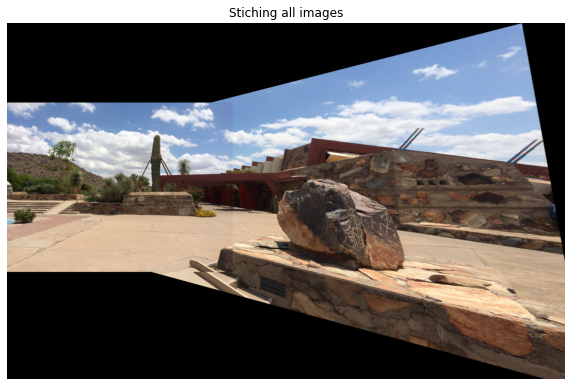

In [14]:
rock=[]
for i in [1,2]:
    img = read_img("./../images/Image_Mosaicing/3_"+str(i)+".png")
    rock.append(img)

out = stitch_multiple(rock)

plt.figure(figsize = [10,10])
plt.imshow(out)
plt.title('Stiching all images')
plt.axis('off')
plt.show()

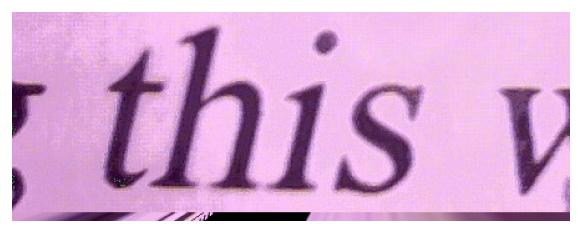

In [15]:
taj=[]
for i in [1,2]:
    img = read_img("./../images/Image_Mosaicing/4_"+str(i)+".jpg")
    taj.append(img)

out = stitch_multiple(taj)
show_img(out,text='',dpi=120)

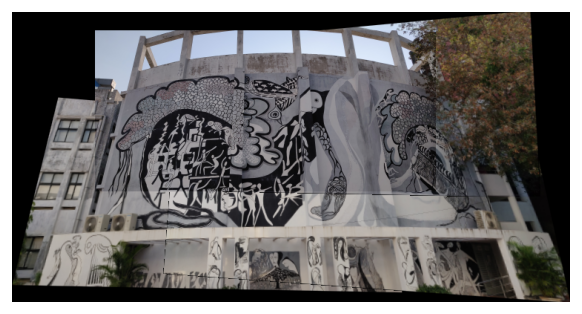

In [16]:
taj=[]
for i in [1,2,3,4]:
    img = read_img("./../images/Image_Mosaicing/5_"+str(i)+".jpg")
    taj.append(resize(img))
out = stitch_multiple(taj)
show_img(out,text='',dpi=120)

## Part 7

Random ordering and stitching
Order of the images [6, 2, 5, 3, 1, 4]


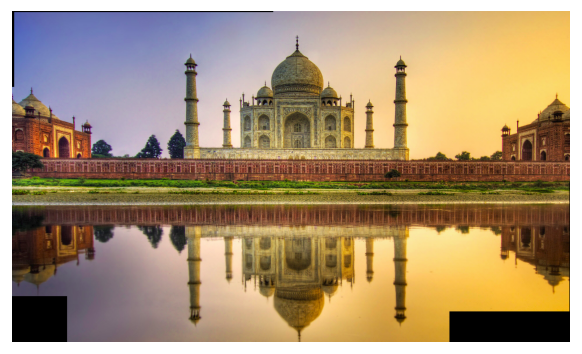

In [17]:
print("Random ordering and stitching")
images=[]
order = [1,2,3,4,5,6]

# Random shuffling to test the working of the algorithm 
random.shuffle(order)

print("Order of the images",order)
taj=[]
for i in order:
    img = read_img('./../images/Image_Mosaicing/2_'+str(i)+'.png')
    taj.append(img)

out = stitch_multiple(taj)
show_img(out,text='',dpi=120)


# Question 2

In [18]:
def corr(a,b):
    v1 = a-np.mean(a)
    v2 = b-np.mean(b)
    return abs((v1.dot(v2))/((np.linalg.norm(v2)+1)*(np.linalg.norm(v1)+1)))

def correlation_matching(img1,img2,window_size=45,stridex=45,stridey=45):
    h1,w1,_ = img1.shape
    h2,w2,_ = img2.shape

    best_matches = []
    least_coord = 0
    for y1 in range(0,h1-window_size+1,stridey):
        for x1 in range(0,w1-window_size+1,stridex):
            least_dis = -np.inf
            for y2 in range(0,h2-window_size+1,stridey):
                for x2 in range(0,w2-window_size+1,stridex):
                    v1 = img1[y1:y1+window_size, x1:x1+window_size,:].flatten()
                    v2 = img2[y2:y2+window_size, x2:x2+window_size,:].flatten()
                    dis = corr(v1,v2)
                    # print([y1,x1,y2,x2])
                    if dis>least_dis:
                        least_dis = dis
                        least_coord = [y1,x1,y2,x2,dis]
            best_matches.append(least_coord)
    return best_matches

def draw_matches(img1,img2,matches,window_size=128):
    '''
    A helper function to draw the matches stored in above function.
    '''
    img = np.hstack((img1,img2))
    h,w,_ = img1.shape
    for match in matches:
        color = tuple(np.random.randint(0,255,3).tolist())
        pt1 = (match[1]+window_size//2,match[0]+window_size//2)
        pt2 = (match[3]+w+window_size//2,match[2]+window_size//2)
        img1_col = cv2.line(img, pt1, pt2, color,1)
        img1_col = cv2.circle(img1_col,tuple(pt1),3,color,1)
        img2_col = cv2.circle(img1_col,tuple(pt2),3,color,1)
    return img2_col

## Part 1

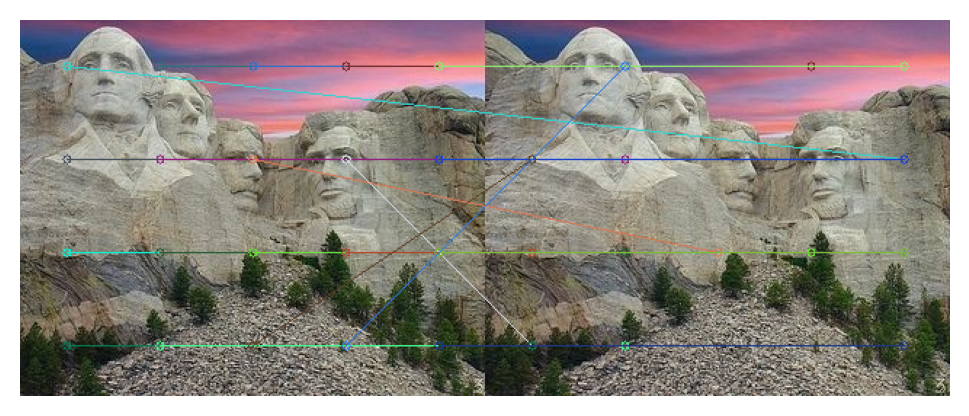

In [19]:
img1 = read_img('./../images/Stereo_Correspondence/1_1.jpg')
img2 = read_img('./../images/Stereo_Correspondence/1_2.jpg')

matches = correlation_matching(img1,img2,64,64,64)
dis_im = draw_matches(img1,img2,matches,64)

show_img(dis_im,text='',dpi=200)

## Part 2

In [20]:
def sift_matching_RANSAC(img1,img2,min_match_cnt=500,match_th =0.8):
    '''
    Returns correspondings points in the two images and the fundamental axis using best SIFT features as correspondances to find the fundamental matrix
    '''
    sift = cv2.SIFT_create()
    h,w,c = img1.shape
    kp=[]
    for i in range(1,h,10):
        for j in range(1,w,10):
            kp.append(cv2.KeyPoint(i, j, 3))
    
    gray_im1 = cv2.cvtColor(img1,cv2.COLOR_RGB2GRAY)
    kp1,des1 = sift.compute(gray_im1,kp)

    gray_im2 = cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)
    kp2,des2 = sift.compute(gray_im2,kp)
    
    index_params = dict(algorithm = 1, trees = 5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params,search_params)
    matches = flann.knnMatch(des1,des2,k=2)
    
    pts1 = []
    pts2 = []
    for i,(m,n) in enumerate(matches):
        if m.distance < match_th*n.distance:
            pts2.append(kp2[m.trainIdx].pt)
            pts1.append(kp1[m.queryIdx].pt)
    pts1 = np.float32(pts1)
    pts2 = np.float32(pts2)
    
    F, mask = cv2.findFundamentalMat(pts1,pts2,cv2.RANSAC)
    pts1 = pts1[mask.ravel()==1]
    pts2 = pts2[mask.ravel()==1]

    return pts1,pts2,F

def drawlines(img1,img2,lines,pts1,pts2):
    ''' img1 - image on which we draw the epilines for the points in img2
        lines - corresponding epilines '''
    r,c,_ = img1.shape
    for r,pt1,pt2 in zip(lines,pts1,pts2):
        color = tuple(np.random.randint(0,255,3).tolist())
        x0,y0 = map(int, [0, -r[2]/r[1] ])
        x1,y1 = map(int, [c, -(r[2]+r[0]*c)/r[1] ])
        img1 = cv2.line(img1, (x0,y0), (x1,y1), color,1)
        img1 = cv2.circle(img1,tuple(pt1),5,color,-1)
        img2 = cv2.circle(img2,tuple(pt2),5,color,-1)
    return img1,img2

def compute_epipolar_lines(pt, img, F):
    _,N = pt.shape
    if img==1:
        line = F @ pt
    else:
        line = (F.T)@ pt
    return normalise_lines(line,N)
def normalise_lines(mat,N):
    ''' 
    Scale coefficients of the obtained lines such that a^2+b^2=1
    '''
    norm = np.zeros((1,N))
    s = mat.copy()
    norm = np.sum((mat[:2,:])**2, axis = 0)
    mat = mat/(np.tile(norm, (3, 1)))
    return mat

# normalise_lines(np.repeat(x,3,axis=0),4)


<ipython-input-20-31d3e13ad293>:49: DeprecationWarning: an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  img1 = cv2.circle(img1,tuple(pt1),5,color,-1)
<ipython-input-20-31d3e13ad293>:50: DeprecationWarning: an integer is required (got type numpy.float32).  Implicit conversion to integers using __int__ is deprecated, and may be removed in a future version of Python.
  img2 = cv2.circle(img2,tuple(pt2),5,color,-1)


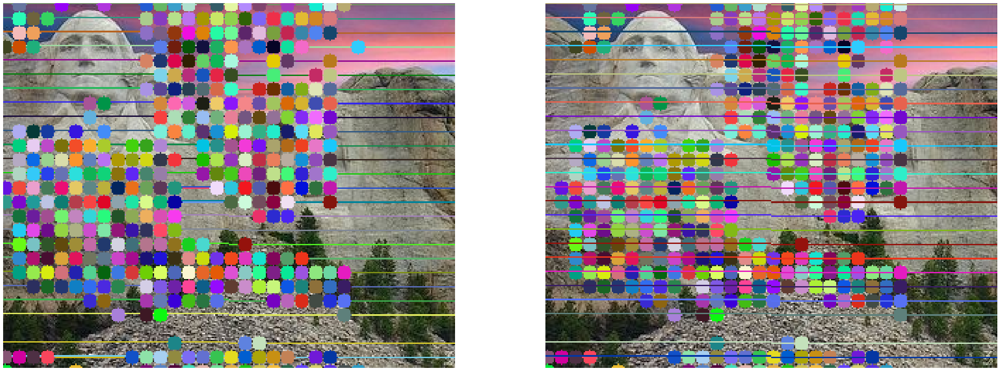

In [21]:
# Find epilines corresponding to points in right image (second image) and
# drawing its lines on left image

img1 = read_img('./../images/Stereo_Correspondence/1_1.jpg')
img2 = read_img('./../images/Stereo_Correspondence/1_2.jpg')

pts1, pts2, F = sift_matching_RANSAC (img1,img2)
# print('pts',pts2.shape)
pts2_norm = cv2.convertPointsToHomogeneous(pts2)
pts1_norm = cv2.convertPointsToHomogeneous(pts1)
lines1 = compute_epipolar_lines(np.squeeze(pts2_norm, axis=1).T, 2,F)

img5,img6 = drawlines(img1,img2,lines1.T,pts1,pts2)
# Find epilines corresponding to points in left image (first image) and
# drawing its lines on right image
lines2 = compute_epipolar_lines(np.squeeze(pts1_norm, axis=1).T, 1,F)

img3,img4 = drawlines(img2,img1,lines2.T,pts2,pts1)

plt.figure(figsize = [40,80])
plt.subplot(121),plt.imshow(img5)
plt.axis('off')
plt.subplot(122),plt.imshow(img3)
plt.axis('off')
plt.show()

## Part 3

In [22]:
def stereo_rectification(img1,img2,pts1,pts2,F):
    '''
    Returns stereo rectified images of img1 and img2, given the stereo correspondence (pts1,pts2) and the fundamental matrix F 
    '''

    p,H1,H2=cv2.stereoRectifyUncalibrated(pts1, pts2, F, img2.shape[0:2][::-1])

    H3 = H1.dot(H2)
    img1_corrected = cv2.warpPerspective(img1, H1, img1.shape[0:2][::-1])
    img2_corrected = cv2.warpPerspective(img2, H3, img2.shape[0:2][::-1])

    return img1_corrected, img2_corrected

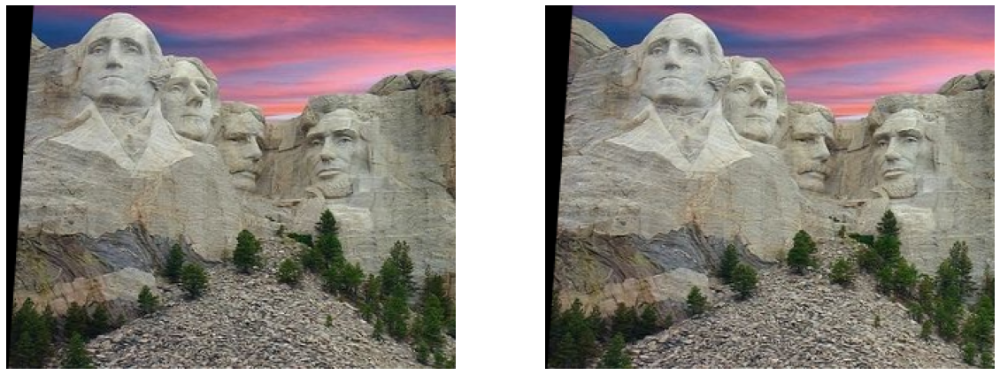

In [23]:
img1 = read_img('./../images/Stereo_Correspondence/1_1.jpg')
img2 = read_img('./../images/Stereo_Correspondence/1_2.jpg')

pts1, pts2, F = sift_matching_RANSAC (img1,img2)
rect_img1, rect_img2 = stereo_rectification(img1,img2,pts1,pts2,F)

plt.figure(figsize = [20,20])
plt.subplot(121),plt.imshow(rect_img1)
plt.axis('off')
plt.subplot(122),plt.imshow(rect_img2)
plt.axis('off')
plt.show()

In [24]:
def greedy_stereo(img1, img2, window_size = 45, stridex = 5, stridey = 5):
    '''
    Search for matches only along the epipolar lines
    '''

    h1,w1,_ = img1.shape
    h2,w2,_ = img2.shape

    best_matches = []
    for y1 in range(0,h1-window_size+1,stridey):
        for x1 in range(0,w1-window_size+1,stridex):
            least_dis = -np.inf
            v1 = img1[y1:y1+window_size, x1:x1+window_size,:].flatten()
            for x2 in range(0,w2-window_size+1,stridex):
                v2 = img2[y1:y1+window_size, x2:x2+window_size,:].flatten()
                dis = corr(v1,v2)
                # print([y1,x1,y2,x2])
                if dis>least_dis:
                    least_dis = dis
                    least_coord = [y1,x1,y1,x2,dis]
            best_matches.append(least_coord)
    return best_matches

def draw_matches_rec(img1,img2,matches,window_size=128):
    '''
    A helper function to draw the matches stored in above function.
    '''
    img = cv2.hconcat([img1, img1]) 
    h,w,_ = img1.shape
    for match in matches:
        color = tuple(np.random.randint(0,255,3).tolist())

        pt1 = (match[1]+window_size//2,match[0]+window_size//2)
        pt2 = (match[3]+w+window_size//2,match[2]+window_size//2)
        p1 = (match[1], match[0])
        p2 = (match[3]+w, match[2])
        # print(pt1,pt2)
        img1_col = cv2.line(img, pt1, pt2, color,1)
        img1_col  = cv2.rectangle(img1_col, p1, (match[1]+window_size,match[0]+window_size), color, thickness=1)
        img1_col  = cv2.rectangle(img1_col, p2, (match[3]+w+window_size,match[2]+window_size), color, thickness=1)
        img1_col = cv2.circle(img1_col,tuple(pt1),5,color,-1)
        img2_col = cv2.circle(img1_col,tuple(pt2),5,color,-1)
    
    return img2_col

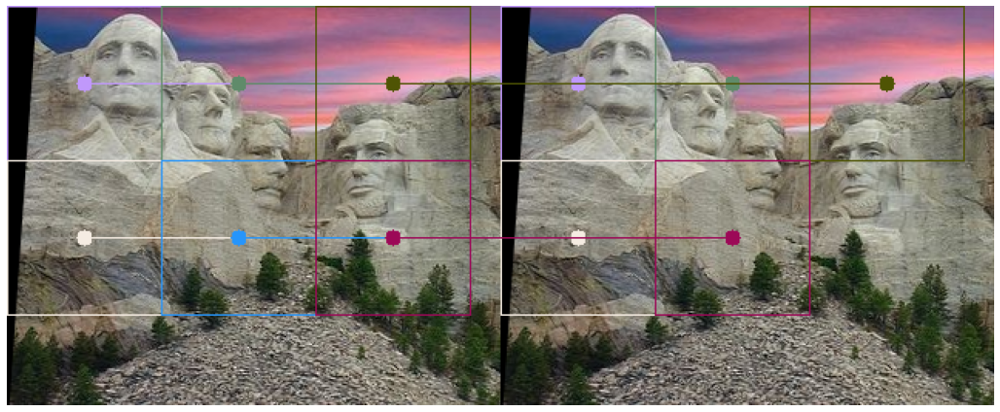

In [25]:
img1 = read_img('./../images/Stereo_Correspondence/1_1.jpg')
img2 = read_img('./../images/Stereo_Correspondence/1_2.jpg')

pts1, pts2, F = sift_matching_RANSAC (img1,img2)
rect_img1, rect_img2 = stereo_rectification(img1,img2,pts1,pts2,F)

matches = greedy_stereo(rect_img1, rect_img2, 100, 100, 100)
dis_im = draw_matches_rec(rect_img1,rect_img2,matches,100)


plt.figure(figsize = [40,80])
plt.subplot(121),plt.imshow(dis_im)
plt.axis('off')
plt.show()


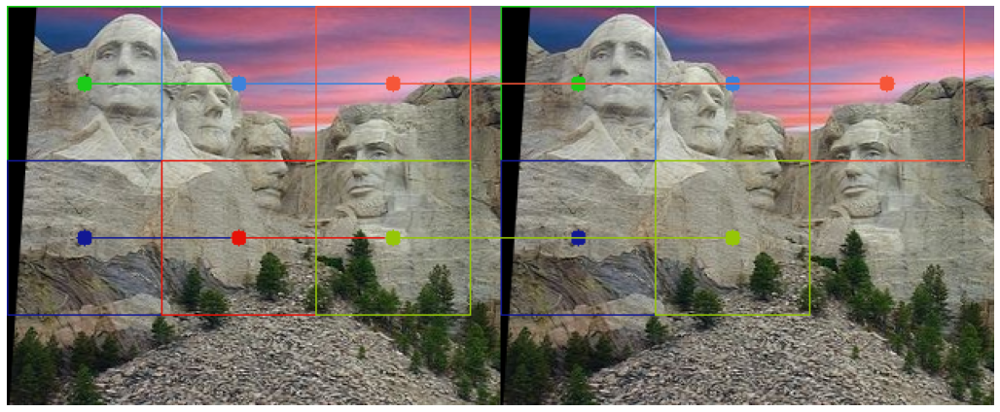

In [33]:
img1 = read_img('./../images/Stereo_Correspondence/1_1.jpg')
img2 = read_img('./../images/Stereo_Correspondence/1_2.jpg')

pts1, pts2, F = sift_matching_RANSAC (img1,img2)
rect_img1, rect_img2 = stereo_rectification(img1,img2,pts1,pts2,F)

matches = correlation_matching(rect_img1, rect_img2, 100,100,100)
dis_im = draw_matches_rec(rect_img1, rect_img2,  matches,100)


plt.figure(figsize = [40,80])
plt.subplot(121),plt.imshow(dis_im)
plt.axis('off')
plt.show()


## Part 4 

## 2.4. Compare the Brute force and Greedy based solution for the Stereo Correspondence problem.

Brute force and Greedy approaches for stereo matching problem have been presented in the sections 2.1 and 2.3 

## Method - Procedure :

### Brute force :
For all the patches in the first image, we should search through all the patches in the second image and find the one that has the least distance or highest correlation.

#### Order : 
( N1 X M1 ) X ( N2 X M2 )

Where,
N1 X M1 is the number of patches in the first image.<br>
N2 X M2 is the number of patches in the second image.<br>


This is very inefficient and can produce undesirable results as there is a possibility that there might be a patch in the target image which fits in better than the actual correspondace. This is also seen the results of the images in section 2.1 above, the matches are not very nice.


### Greedy Method : 
We make use of the epipolar constraint and lower the search space for each of the patches in the first image. 

#### Order :
( N1 X M1 ) X ( N2<sup>2</sup> + M2<sup>2</sup> )<sup>1/2</sup>

Where,
N1 X M1 is the number of patches in the first image.<br>
( N2<sup>2</sup> + M2<sup>2</sup> )<sup>1/2</sup> is the maximum length of an epipolar line in the second image.<br>


This is more efficient comparative to the brute force approach as the search space is reduced. Even if there are mismatches in the correspondances of the patches, we have lesser probability of that happening as the search space is reduced (total number of possibilities for a probable mismatch decrease). If we use this technique on rectified images, the process becomes more efficient (Order becomes ( N1 X M1 X N2 )) and also the matches are well conditioned in this case. As we see from the results of section 2.3, we see that the search results are very ordered and accurate compared to the searches in Greedy method.

### SIFT

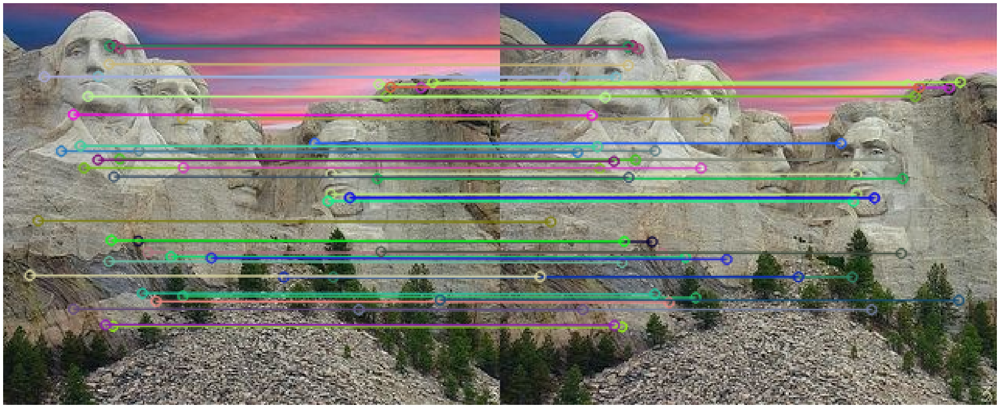

In [27]:

img1_col = read_img('./../images/Stereo_Correspondence/1_1.jpg')
img2_col = read_img('./../images/Stereo_Correspondence/1_2.jpg')

img1 = cv2.cvtColor(img1_col, cv2.COLOR_BGR2GRAY)
img2 = cv2.cvtColor(img2_col, cv2.COLOR_BGR2GRAY)

sift = cv2.SIFT_create()

keypoints_1, descriptors_1 = sift.detectAndCompute(img1,None)
keypoints_2, descriptors_2 = sift.detectAndCompute(img2,None)

bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)

matches = bf.match(descriptors_1,descriptors_2)
matches = sorted(matches, key = lambda x:x.distance)

img3 = cv2.drawMatches(img1_col, keypoints_1, img2_col, keypoints_2, matches[:50], img2_col, flags=2)

plt.figure(figsize = [40,80])
plt.imshow(img3)
plt.axis('off')
plt.show()

### Brute force

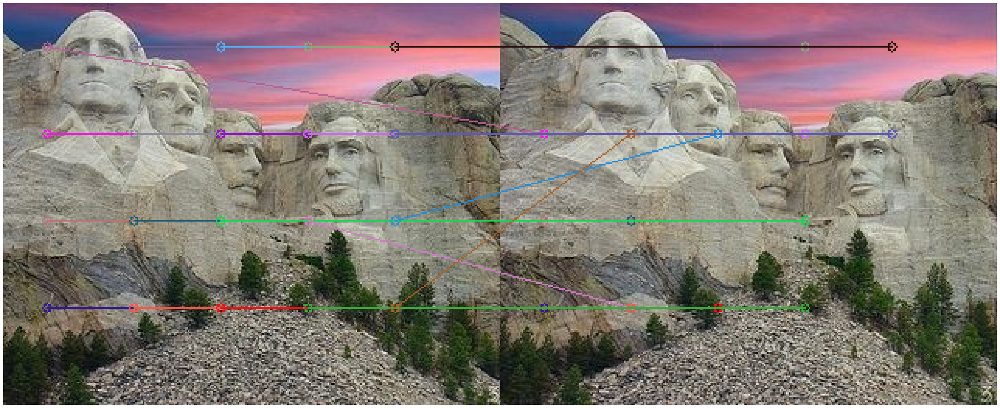

In [28]:
img1 = read_img('./../images/Stereo_Correspondence/1_1.jpg')
img2 = read_img('./../images/Stereo_Correspondence/1_2.jpg')

matches = correlation_matching(img1,img2,56,56,56)
dis_im = draw_matches(img1,img2,matches,56)

plt.figure(figsize = [40,80])
plt.imshow(dis_im)
plt.axis('off')
plt.show()

## Image 2

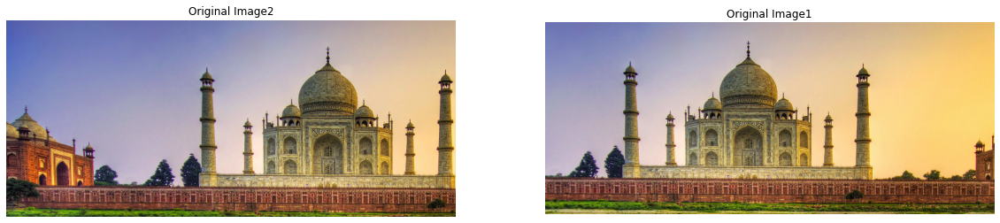

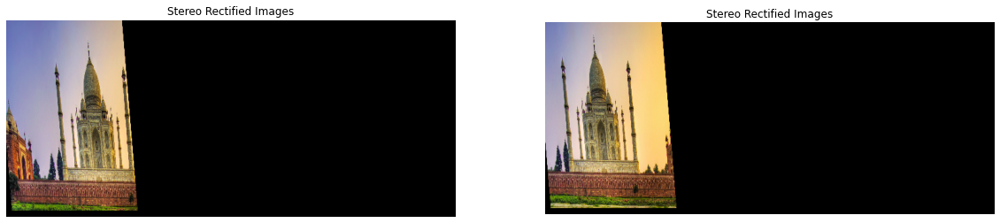

In [29]:
img1 = read_img('./../images/Stereo_Correspondence/2_1.png')
img2 = read_img('./../images/Stereo_Correspondence/2_2.png')

plt.figure(figsize = [20,20])
plt.subplot(121),plt.imshow(img1)
plt.title("Original Image2")
plt.axis('off')
plt.subplot(122),plt.imshow(img2)
plt.axis('off')
plt.title("Original Image1")
plt.show()

pts1, pts2, F = sift_matching_RANSAC (img1,img2)
rect_img1, rect_img2 = stereo_rectification(img1,img2,pts1,pts2,F)

plt.figure(figsize = [20,20])
plt.subplot(121),plt.imshow(rect_img1)
plt.title("Stereo Rectified Images")
plt.axis('off')
plt.subplot(122),plt.imshow(rect_img2)
plt.axis('off')
plt.title("Stereo Rectified Images")
plt.show()



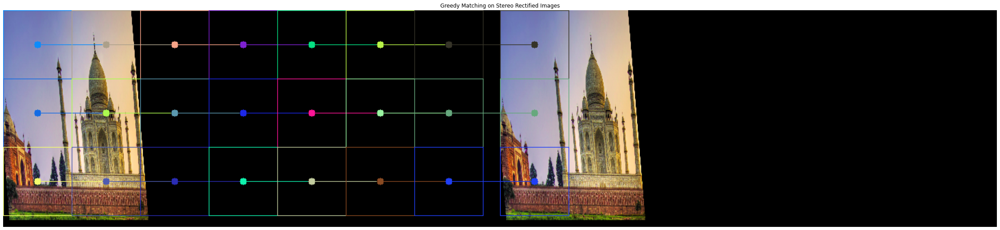

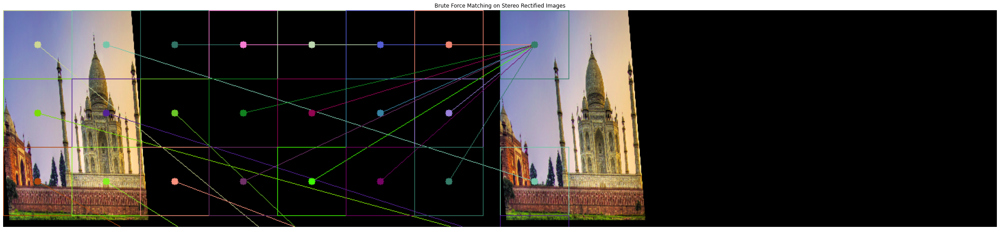

In [30]:
rect_img2 = cv2.resize(rect_img2, (rect_img1.shape[0],rect_img2.shape[1]), interpolation = cv2.INTER_AREA)

matches = greedy_stereo(rect_img1, rect_img2, 100, 100, 100)
dis_im = draw_matches_rec(rect_img1,rect_img2,matches,100)

plt.figure(figsize = [40,70])
plt.imshow(dis_im)
plt.axis('off')
plt.title("Greedy Matching on Stereo Rectified Images")
plt.show()

matches = correlation_matching(rect_img1, rect_img2, 100,100,100)
dis_im = draw_matches_rec(rect_img1, rect_img2,  matches,100)

plt.figure(figsize = [40,70])
plt.imshow(dis_im)
plt.axis('off')
plt.title("Brute Force Matching on Stereo Rectified Images")
plt.show()


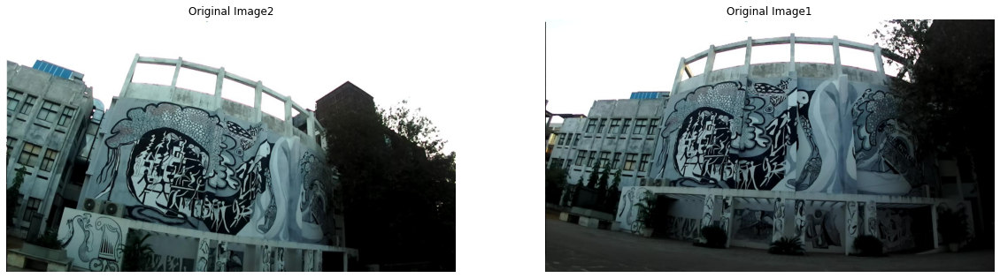

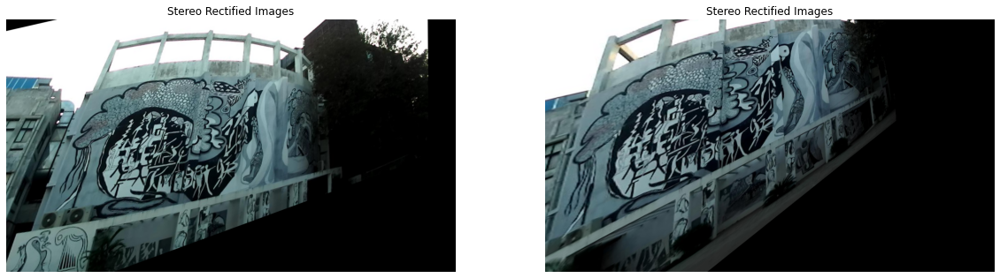

In [31]:
img1 = read_img('./../images/Stereo_Correspondence/3_1.jpg')
img2 = read_img('./../images/Stereo_Correspondence/3_2.jpg')

plt.figure(figsize = [20,20])
plt.subplot(121),plt.imshow(img1)
plt.title("Original Image2")
plt.axis('off')
plt.subplot(122),plt.imshow(img2)
plt.axis('off')
plt.title("Original Image1")
plt.show()

pts1, pts2, F = sift_matching_RANSAC (img1,img2)
rect_img1, rect_img2 = stereo_rectification(img1,img2,pts1,pts2,F)

plt.figure(figsize = [20,20])
plt.subplot(121),plt.imshow(rect_img1)
plt.title("Stereo Rectified Images")
plt.axis('off')
plt.subplot(122),plt.imshow(rect_img2)
plt.axis('off')
plt.title("Stereo Rectified Images")
plt.show()


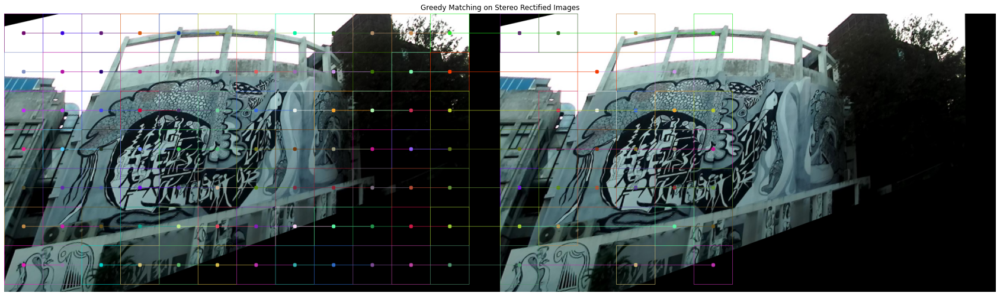

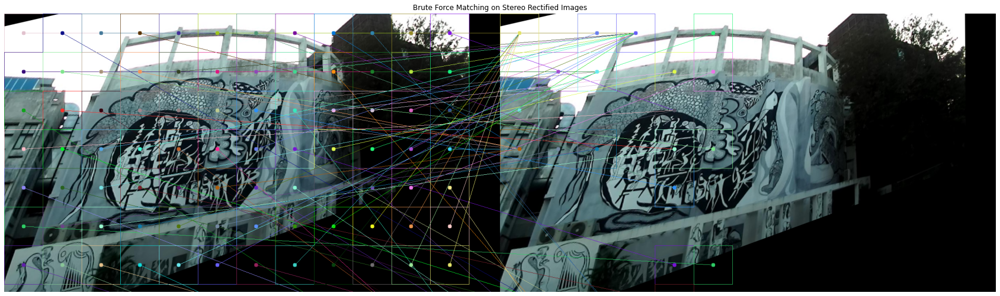

In [32]:
rect_img2 = cv2.resize(rect_img2, (rect_img1.shape[0],rect_img2.shape[1]), interpolation = cv2.INTER_AREA)

matches = greedy_stereo(rect_img1, rect_img2, 100, 100, 100)
dis_im = draw_matches_rec(rect_img1,rect_img2,matches,100)

plt.figure(figsize = [30,50])
plt.imshow(dis_im)
plt.axis('off')
plt.title("Greedy Matching on Stereo Rectified Images")
plt.show()

matches = correlation_matching(rect_img1, rect_img2, 100,100,100)
dis_im = draw_matches_rec(rect_img1, rect_img2,  matches,100)

plt.figure(figsize = [30,50])
plt.imshow(dis_im)
plt.axis('off')
plt.title("Brute Force Matching on Stereo Rectified Images")
plt.show()
